In [12]:
import lensing
from importlib import reload
reload(lensing)
from lensing import *
import matplotlib.pyplot as plt
from astropy.convolution import convolve, AiryDisk2DKernel, Gaussian2DKernel
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord

In [2]:
zoom = 4
galaxy_image = open_fits("new2.fits")
galaxy_image = galaxy_image*zoom
x_deflections = open_fits("glafic-model/hlsp_relics_model_model_whl0137-08_glafic_v1_x-arcsec-deflect.fits")
y_deflections = open_fits("glafic-model/hlsp_relics_model_model_whl0137-08_glafic_v1_y-arcsec-deflect.fits")
magnification_values = open_fits("glafic-model/hlsp_relics_model_model_whl0137-08_glafic_v1_z06p2-magnif.fits")

In [3]:
image_pixel_scale = 0.031
image_center = (20,-32)
#image_center = (24.85,-29.55)
image_pix = 1000
air_pix=0.05/image_pixel_scale

image_plane_corners = grid(image_center, image_pix+1, image_pixel_scale)
image_plane_centers = grid(image_center, image_pix, image_pixel_scale)
deflections_grid = grid((0,0), 1200, 0.1)
traced_image_plane_corners = ray_trace_grid(deflections_grid, x_deflections, y_deflections, image_plane_corners, 0.566, 6.2)
image_plane_magnification = magnification_line(deflections_grid, magnification_values,image_plane_centers)
caustic_line = caustic(deflections_grid, x_deflections, y_deflections, deflections_grid, magnification_values, image_plane_centers, 0.566, 6.2)

## Source Plane Center

In [4]:
w = WCS(fits.open('glafic-model/hlsp_relics_model_model_whl0137-08_glafic_v1_x-arcsec-deflect.fits')[0].header)
# locate pixel coordinates of earendel
c = SkyCoord(ra=24.3468342, dec=-8.4645026, unit='deg',frame="fk5")
w.world_to_pixel(c)

(array(848.47727839), array(305.44615279))

In [5]:
earendel_location = [deflections_grid[0][1200-305,848], deflections_grid[1][1200-305,848]]
# print coordinates of earendel on source plane
print(earendel_location)
# ray trace earendel back to source plane
ray_trace_points(deflections_grid,x_deflections,y_deflections,np.array([earendel_location]),z1=0.566,z2=6.2)

[24.85000000000001, -29.549999999999997]


array([[ 0.11328659, -7.60763245]])

In [6]:
source_pixel_scale = 0.0001*zoom
source_center = (0.11328659, -7.60763245)
source_pix = 1000
source_plane = grid(source_center, source_pix, source_pixel_scale)

## Noise

In [7]:
hdu = fits.open("../../Downloads/MAST_2023-10-26T1835/JWST/jw02282-o010_t001_nircam_clear-f200w/jw02282-o010_t001_nircam_clear-f200w_i2d.fits")
hdu[1].header["BUNIT"]

'MJy/sr'

In [8]:
from astropy.stats import sigma_clipped_stats

pixel_sr = hdu[1].header["PIXAR_SR"]
MJy_sr_to_Jy = 1e6*pixel_sr
observation = hdu[1].data*MJy_sr_to_Jy

mean, median, sigma = sigma_clipped_stats(observation[observation != 0])
print(f"background level: {mean} Jy noise: {sigma} Jy")

background level: 5.090039500998955e-09 Jy noise: 2.9400429313319876e-10 Jy


## Lensing

In [9]:
galaxy_center = (0.05,-0.05)
galaxy_angle = -70

transformed_galaxy = transform_image(galaxy_image, galaxy_angle, galaxy_center, source_pixel_scale)
lensed_image = lens_image(transformed_galaxy, source_plane, traced_image_plane_corners)
lensed_image = convolve(lensed_image, Gaussian2DKernel(2.065/2.355))
#lensed_image = convolve(lensed_image, AiryDisk2DKernel(2.5),fill_value=0,nan_treatment='fill')
lensed_image = lensed_image + np.random.normal(5e-9,3e-10,(image_pix,image_pix))
# hdu = fits.PrimaryHDU(np.flip(transformed_galaxy,axis=0))
# hdu.writeto('new_galaxy.fits')

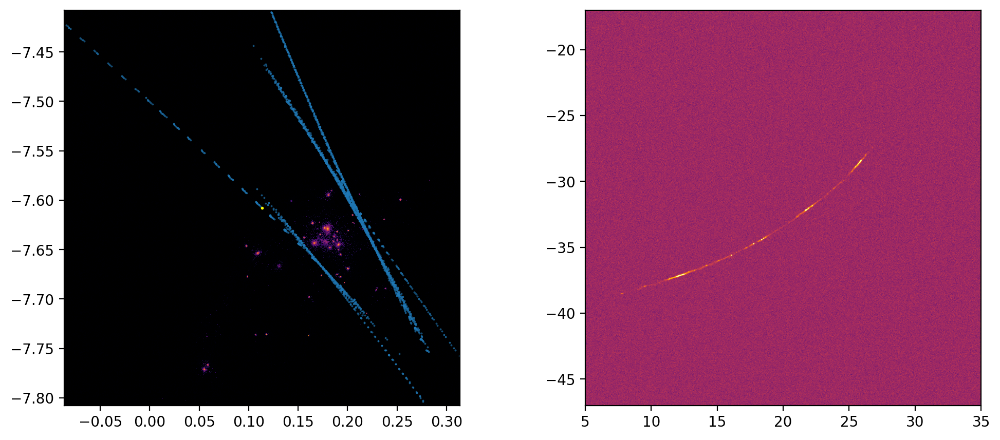

In [10]:
from matplotlib.colors import LogNorm

# plot source image
extent = [source_center[0]-0.05*zoom,source_center[0]+0.05*zoom,source_center[1]-0.05*zoom,source_center[1]+0.05*zoom]
fig, ax = plt.subplots(1, 2, figsize=(12, 5), dpi=200)
ax[0].scatter(caustic_line[:,0],caustic_line[:,1],s=0.1)
ax[0].set_xlim(extent[:2])
ax[0].set_ylim(extent[2:])
ax[0].scatter(source_center[0],source_center[1],s=1,c="yellow")
ax[0].imshow(transformed_galaxy, extent=extent, cmap='inferno',norm=LogNorm())
ax[0].set_facecolor('black')

#ax[1].scatter(image_plane_magnification[:,0], image_plane_magnification[:,1], s=0.01)
ax[1].imshow(lensed_image, extent=[image_center[0]-15,image_center[0]+15,image_center[1]-15,image_center[1]+15], cmap='inferno',norm=LogNorm(vmin=3e-9,vmax=1e-8))
ax[1].set_facecolor('black')
plt.show()

In [160]:
hdu = fits.PrimaryHDU(np.flip(lensed_image/MJy_sr_to_Jy,axis=0))
hdu.writeto('sunrise8.fits',overwrite=True)

## Polygons on Source Plane

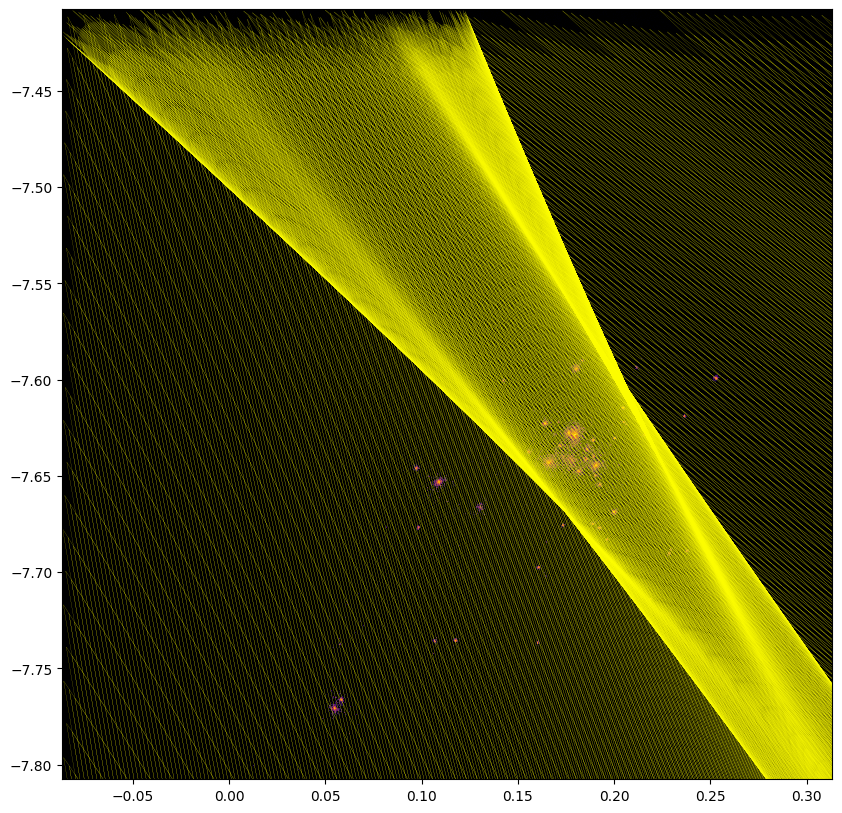

In [13]:
from matplotlib.patches import Polygon

fig, ax = plt.subplots(1,1,figsize=(10,10))
polygons = get_traced_pixels(source_plane,traced_image_plane_corners)
polygons = [Polygon(p,closed=True,fill=False,color='yellow',lw=0.1) for p in polygons]
ax.set_xlim(extent[:2])
ax.set_ylim(extent[2:])
ax.scatter(source_center[0],source_center[1],s=1,c="yellow")
ax.imshow(transformed_galaxy, extent=extent, cmap='inferno',norm=LogNorm())
ax.set_facecolor('black')
for i,p in enumerate(polygons):
    ax.add_patch(p)

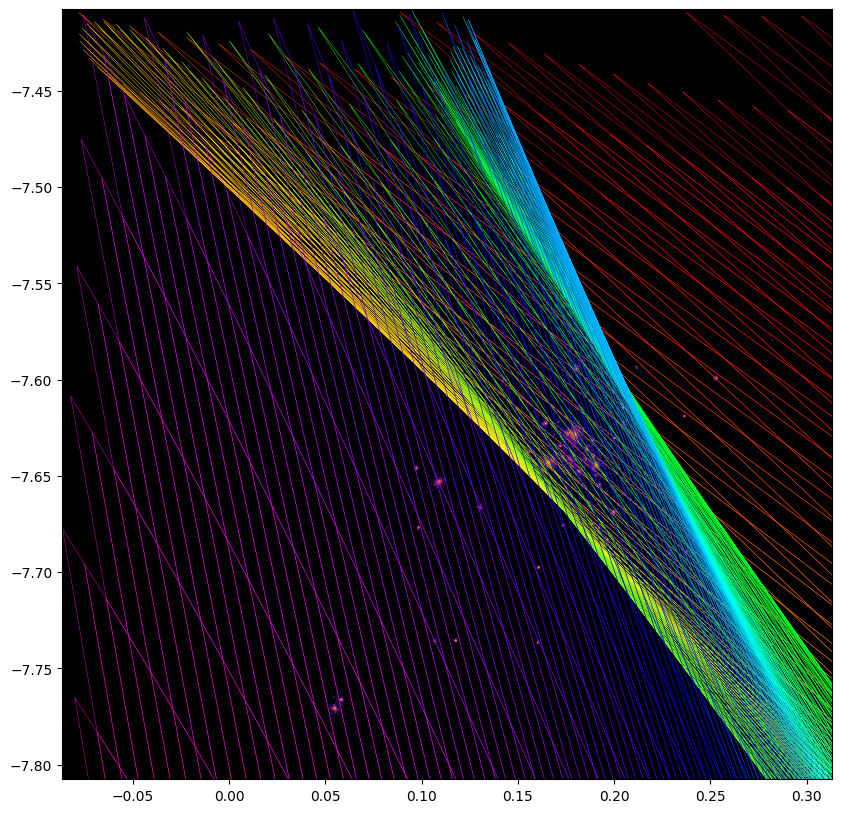

In [14]:
import matplotlib as mpl
cmap = mpl.colormaps['gist_rainbow']
scale = 4
downsampled_image_plane_corners = grid(image_center, int(image_pix/scale), image_pixel_scale*scale)
downsampled_traced_image_plane_corners = ray_trace_grid(deflections_grid, x_deflections, y_deflections, downsampled_image_plane_corners, 0.566, 6.2)
fig, ax = plt.subplots(1,1,figsize=(10,10))
polygons = get_traced_pixels(source_plane,downsampled_traced_image_plane_corners)
num_polygons = len(polygons)
polygons = [Polygon(p,closed=True,fill=False,color=cmap(i/num_polygons),lw=0.3) for i,p in enumerate(polygons)]
ax.set_xlim(extent[:2])
ax.set_ylim(extent[2:])
# ax.set_xlim(0.15,0.2)
# ax.set_ylim(-7.7,-7.65)
ax.scatter(source_center[0],source_center[1],s=1,c="yellow")
ax.imshow(transformed_galaxy, extent=extent, cmap='inferno',norm=LogNorm())
ax.set_facecolor('black')
for i,p in enumerate(polygons):
    ax.add_patch(p)

## Animation

  0%|                                                   | 0/360 [00:00<?, ?it/s]

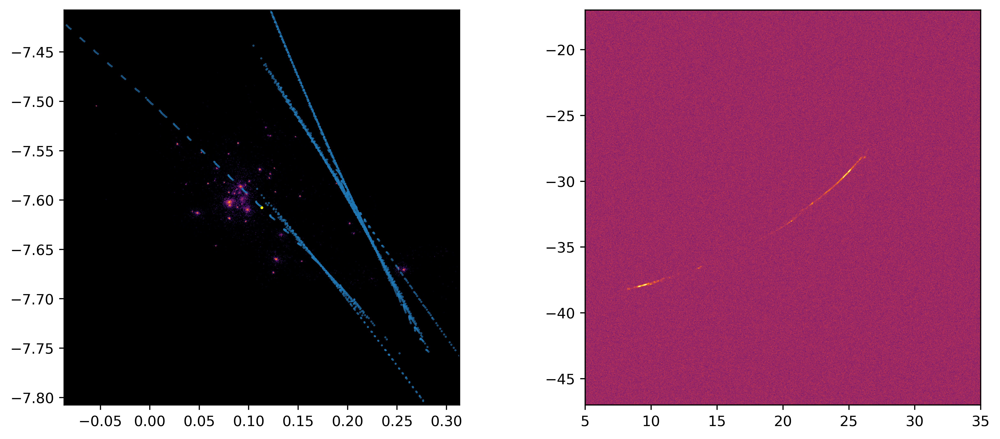

In [174]:
import matplotlib.animation as animation
from tqdm import tqdm

# starting point
#galaxy_center = (-0.01*zoom,-0.01*zoom)
galaxy_center = (0,0)
galaxy_angle = -70

fig, ax = plt.subplots(1, 2, figsize=(12, 5), dpi=500)

extent = [source_center[0]-0.05*zoom,source_center[0]+0.05*zoom,source_center[1]-0.05*zoom,source_center[1]+0.05*zoom]
# plot center of source plane
ax[0].scatter(source_center[0],source_center[1],s=1,c="yellow")
ax[0].scatter(caustic_line[:,0],caustic_line[:,1],s=0.1)
ax[0].set_xlim(extent[:2])
ax[0].set_ylim(extent[2:])
im1 = ax[0].imshow(transformed_galaxy, extent=extent, cmap='inferno',norm=LogNorm())
ax[0].set_facecolor('black')

#ax[1].scatter(image_plane_magnification[:,0], image_plane_magnification[:,1], s=0.01)
im2 = ax[1].imshow(lensed_image, extent=[image_center[0]-15,image_center[0]+15,image_center[1]-15,image_center[1]+15], cmap='inferno',norm=LogNorm(vmin=3e-9,vmax=1e-8))
ax[1].set_facecolor('black')

noise = np.random.normal(5e-9,3e-10,(image_pix,image_pix))

pbar = tqdm(total=360,ncols=80)

def init():
    return [im1,im2]

def animate(i):
    pbar.update(1)
    galaxy_angle = i
    transformed_galaxy = transform_image(galaxy_image, galaxy_angle, galaxy_center, source_pixel_scale)
    lensed_image = lens_image(transformed_galaxy, source_plane, traced_image_plane_corners)
    lensed_image = convolve(lensed_image, Gaussian2DKernel(2.065/2.355,x_size=3,y_size=3))
    #lensed_image = convolve(lensed_image, AiryDisk2DKernel(2.5),fill_value=0,nan_treatment='fill')
    lensed_image = lensed_image + noise
    im1.set_array(transformed_galaxy)
    im2.set_array(lensed_image)
    return [im1,im2]

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=360, interval=100, blit=True)

In [175]:
FFwriter = animation.FFMpegWriter(fps=10)
anim.save('rotate.mp4', writer = FFwriter)
pbar.close()

100%|█████████████████████████████████████████| 360/360 [15:08<00:00,  2.52s/it]
